<a href="https://colab.research.google.com/github/seshasain/Find_Doppelganger/blob/master/Atmospheric%20Error%20Detection%20and%20Correction%20of%20SATELLITE%20IMAGERY%3A%20DARK%20CHANNEL%20REFLECTANCE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Libraries Required**

---



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
band1='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B1.TIF'
band2='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B2.TIF'
band3='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B3.TIF'
band4='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B4.TIF'
band5='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B5.TIF'
band6='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B6.TIF'
band7='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_B7.TIF'

MTL_file='/content/drive/MyDrive/Major_Dataset/LC08_L1TP_136042_20200510_20200820_02_T1/LC08_L1TP_136042_20200510_20200820_02_T1_MTL.txt'

In [ ]:
!pip install pyproj
!pip install opencv-python
!pip install tqdm
!pip install elevation
!pip install richdem
!pip install pysheds
!pip install plantcv
!apt install imagemagick
!pip install fiona
!pip install rasterio
!pip install shapely
!pip install geopandas
!pip install rioxarray
!pip install earthpy
!pip install osgeo

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from osgeo import gdal
import elevation 
from matplotlib.pyplot import figure
import os
import fiona
import rasterio
import rasterio.mask
import numpy as np
from rasterio.crs import CRS
import geopandas as gpd
import xarray as xr
import rioxarray as rxr
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

In [ ]:
def combine_tifs(tif_list):
    out_xr=[]
    for i, tif_path in enumerate(tif_list):
        out_xr.append(rxr.open_rasterio(tif_path, masked=True).squeeze())
        out_xr[i]["band"]=i+1
    return xr.concat(out_xr, dim="band")

In [ ]:
before_correction= combine_tifs([band2,band3,band4])


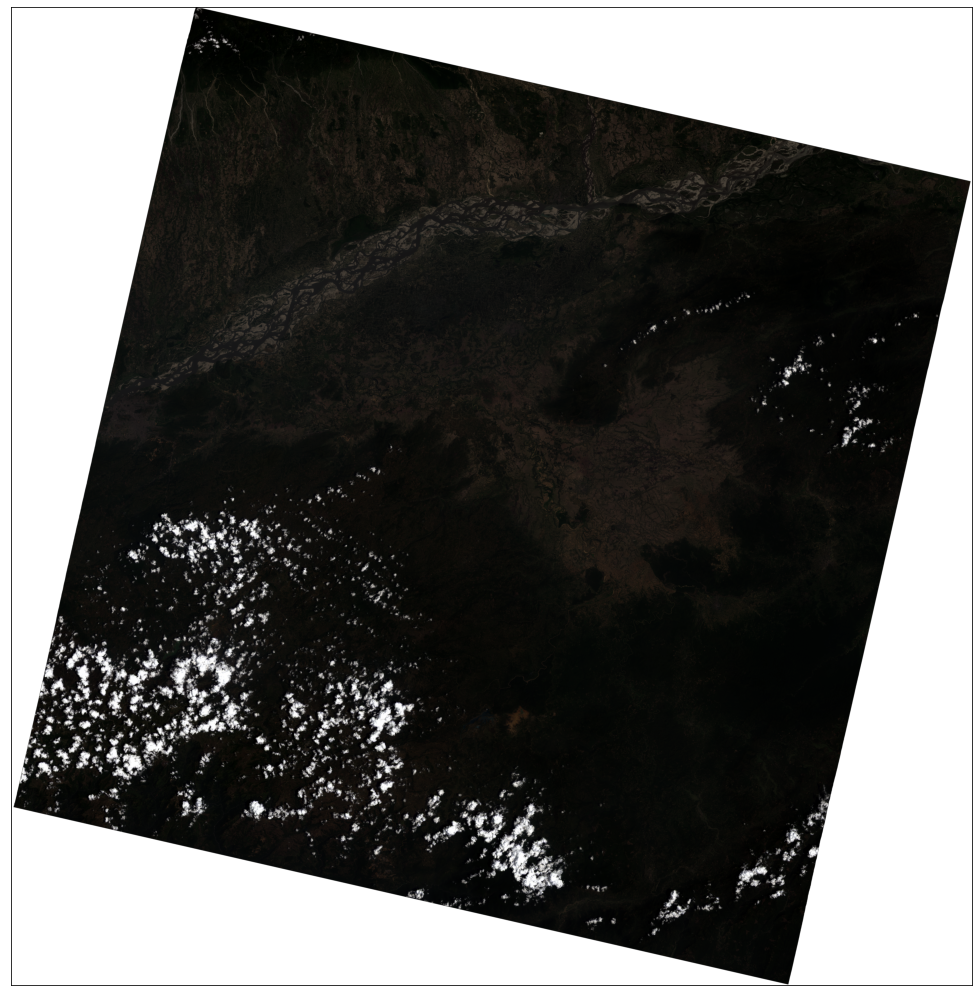

In [ ]:
fig, (ax1) = plt.subplots(1,figsize=(36, 18))
ax1 = ep.plot_rgb(
    before_correction.values,
    rgb=(2, 1, 0),
    ax=ax1,
    stretch=True,
    str_clip=0.5,
)

plt.savefig('before_correction.png', bbox_inches='tight', pad_inches=0)

plt.show()

In [ ]:
import cv2
import numpy as np
import skimage.exposure

# load image
img = cv2.imread('before_correction.png')

# convert to gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold
thresh = cv2.threshold(gray, 11, 255, cv2.THRESH_BINARY)[1]

# apply morphology to clean small spots
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
morph = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, borderType=cv2.BORDER_CONSTANT, borderValue=0)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel, borderType=cv2.BORDER_CONSTANT, borderValue=0)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
morph = cv2.morphologyEx(morph, cv2.MORPH_ERODE, kernel, borderType=cv2.BORDER_CONSTANT, borderValue=0)

# get external contour
contours = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]
big_contour = max(contours, key=cv2.contourArea)

# draw white filled contour on black background as mas
contour = np.zeros_like(gray)
cv2.drawContours(contour, [big_contour], 0, 255, -1)

# blur dilate image
blur = cv2.GaussianBlur(contour, (5,5), sigmaX=0, sigmaY=0, borderType = cv2.BORDER_DEFAULT)

# stretch so that 255 -> 255 and 127.5 -> 0
mask = skimage.exposure.rescale_intensity(blur, in_range=(127.5,255), out_range=(0,255))

# put mask into alpha channel of input
result = cv2.cvtColor(img, cv2.COLOR_BGR2BGRA)
result[:,:,3] = mask
cv2.imwrite('/content/before_correction_transparent.png', result)


True

# Phase 1: Atmospheric Error Detection

In [ ]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def DarkChannel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

In [ ]:
def AtmLight(im, dark):
    [h, w] = im.shape[:2]
    imsz = h * w
    numpx = int(max(math.floor(imsz / 1000), 1))
    darkvec = dark.reshape(imsz, 1)
    imvec = im.reshape(imsz, 3)

    indices = darkvec.argsort()
    indices = indices[imsz - numpx::]

    atmsum = np.zeros([1, 3])
    for ind in range(1, numpx):
        atmsum = atmsum + imvec[indices[ind]]

    A = atmsum / numpx
    return A

In [ ]:
def TransmissionEstimate(im, A, sz, omega):
    im3 = np.empty(im.shape, im.dtype)

    for ind in range(0, 3):
        im3[:, :, ind] = im[:, :, ind] / A[0, ind]

    transmission = 1 - omega * DarkChannel(im3, sz)
    return transmission

In [ ]:
def Recover(im, t, A, tx=0.1):
    res = np.empty(im.shape, im.dtype)
    t = cv2.max(t, tx)

    for ind in range(0, 3):
        res[:, :, ind] = (im[:, :, ind] - A[0, ind]) / t + A[0, ind]

    return res

In [ ]:
def Guidedfilter(im, p, r, eps):
    mean_I = cv2.boxFilter(im, cv2.CV_64F, (r, r))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r))
    mean_Ip = cv2.boxFilter(im * p, cv2.CV_64F, (r, r))
    cov_Ip = mean_Ip - mean_I * mean_p

    mean_II = cv2.boxFilter(im * im, cv2.CV_64F, (r, r))
    var_I = mean_II - mean_I * mean_I

    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r))

    q = mean_a * im + mean_b
    return q

In [ ]:
def TransmissionRefine(im, et):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    gray = np.float64(gray) / 255
    r = 60
    eps = 0.0001
    t = Guidedfilter(gray, et, r, eps)

    return t
def getDist(h):
    return (h+20)*3/5

In [ ]:
file_path='before_correction_transparent.png'
src = cv2.imread(file_path)

I = src.astype('float64') / 255

dark = DarkChannel(I, 15)
A = AtmLight(I, dark)
te = TransmissionEstimate(I, A, 15, 0.95)
t = TransmissionRefine(src, te)
J = Recover(I, t, A, 0.1)

# cv2.imshow("dark", dark)
# cv2.imshow("t", t)
# cv2.imshow('I', src)
# cv2.imshow('J', J)
cv2.imwrite("ans.png", t * 255)

True

In [ ]:
print(t[10][120])

0.0541324010872369


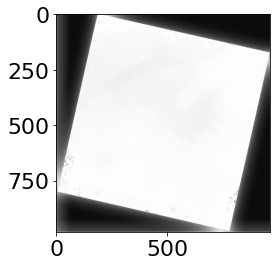

In [ ]:
darkImg = cv2.imread('ans.png')
darkImg = cv2.cvtColor(darkImg, cv2.COLOR_BGR2RGB)
plt.imshow(darkImg)
plt.show()

In [ ]:
hsvPic = cv2.cvtColor(darkImg, cv2.COLOR_RGB2HSV)
black = (0,0,0)
mask = cv2.inRange(hsvPic, black, black)
res = cv2.bitwise_and(darkImg, darkImg, mask)

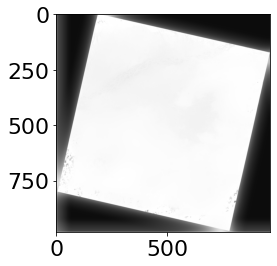

0 0 0 0


In [ ]:
x, y, w, h = cv2.boundingRect(mask)
cv2.rectangle(res, (x, y), (x + w, y + h), (0, 255, 0), 1)
plt.imshow(res)
plt.show()
print(x,y,w,h)

In [ ]:
dist = getDist(h)
center = round(((w-x)/2+x))
size=len(t[h-1])-1
ans = math.fabs(math.log(t[h-1][size]))
print(file_path,ans)

963
before_correction_transparent.png 1.381751190676094


# PHASE 2: Atmospheric Correction

In [ ]:
from osgeo import gdal
import sys

src_ds = gdal.Open( band3 )

print ("[ RASTER BAND COUNT ]: ", src_ds.RasterCount)
for band in range( src_ds.RasterCount ):
    band += 1
    print ("[ GETTING BAND ]: ", band)
    srcband = src_ds.GetRasterBand(band)
    srcband.GetColorTable()
    stats = srcband.GetStatistics( True, True )
    print ("[ STATS ] =  Minimum=%.3f, Maximum=%.3f, Mean=%.3f, StdDev=%.3f" % ( \
            stats[0], stats[1], stats[2], stats[3] ))

[ RASTER BAND COUNT ]:  1
[ GETTING BAND ]:  1
[ STATS ] =  Minimum=7690.000, Maximum=44514.000, Mean=10491.705, StdDev=2980.808


In [ ]:
import rasterio

with rasterio.open(band5) as src:
    meta_profile = src.meta

print(meta_profile)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 7651, 'height': 7791, 'count': 1, 'crs': CRS.from_epsg(32646), 'transform': Affine(30.0, 0.0, 348885.0,
       0.0, -30.0, 2991315.0)}


In [ ]:
"""
  Creating a  Dictionary with key as the "property" and value as 
  numerical value given in the file.
  example  {'REFLECTANCE_MULT_BAND_7 ': ' 1.6439E-03'}
"""

Landsat7_mlt_dict = {}
with open(MTL_file, 'r') as _:
    for line in _:
        line = line.strip()
        if line != 'END':
            key, value = line.split('=')
            Landsat7_mlt_dict[key] = value
print( Landsat7_mlt_dict)

{'GROUP ': ' LEVEL1_PROJECTION_PARAMETERS', 'ORIGIN ': ' "Image courtesy of the U.S. Geological Survey"', 'DIGITAL_OBJECT_IDENTIFIER ': ' "https://doi.org/10.5066/P975CC9B"', 'LANDSAT_PRODUCT_ID ': ' "LC08_L1TP_136042_20200510_20200820_02_T1"', 'PROCESSING_LEVEL ': ' "L1TP"', 'COLLECTION_NUMBER ': ' 02', 'COLLECTION_CATEGORY ': ' "T1"', 'OUTPUT_FORMAT ': ' "GEOTIFF"', 'FILE_NAME_BAND_1 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B1.TIF"', 'FILE_NAME_BAND_2 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B2.TIF"', 'FILE_NAME_BAND_3 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B3.TIF"', 'FILE_NAME_BAND_4 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B4.TIF"', 'FILE_NAME_BAND_5 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B5.TIF"', 'FILE_NAME_BAND_6 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B6.TIF"', 'FILE_NAME_BAND_7 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B7.TIF"', 'FILE_NAME_BAND_8 ': ' "LC08_L1TP_136042_20200510_20200820_02_T1_B8.TIF"', 'FILE_NAME_BAND_9 ': ' "LC08_

Apply Mask

In [ ]:
# Improting Image class from PIL module 
from PIL import Image 
Image.MAX_IMAGE_PIXELS = None

"""
   Arg: 
      img_path_arr = (array of images path that to be masked)
      output_folder = Name of the folder in which all the masked
                                masked images to be stored
  Returns:
      paths = list of path of msked images
  
  Function working:
      First is create a folder named <output_folder>
      This function take a list of paths of the images to masked and
      save the msked image in the <output_folder>. It mask the 
      region over the bhopal in rectangular shape the rectange is 
      950 pixel long and 500 pixel wide.
"""

def apply_mask(img_path_arr, output_folder):
  os.makedirs(output_folder, exist_ok= True)
  paths = list()
  # Opens a image in RGB mode 
  for i, img in enumerate(img_path_arr):
    im = Image.open(img) 
      
    # Setting the points for cropped image 
    left = 1150
    top = 2800
    right = 2100
    bottom = 3300
      
    # Cropped image of above dimension 
    # (It will not change orginal image) 
    im1 = im.crop((left, top, right, bottom)) 
      
    # Save the image 
    output_filename = str(output_folder+'/masked_{}.tif'.format(i))
    im1.save(output_filename)
    paths.append(output_filename)
  #os.close(output_folder)
  return paths
  #import cv2 
  #plt.imshow(cv2.imread('crop.tif'))

In [ ]:
def dn_to_radiance(data_array, band)  :

  # getting the G value 
  channel_gain = float(Landsat7_mlt_dict['RADIANCE_MULT_BAND_'+str(band)+' '])

  # Getting the B value
  channel_offset = float(Landsat7_mlt_dict['RADIANCE_ADD_BAND_'+str(band)+' '])

  # creating a temp array to store the radiance value
  new_data_array = np.empty_like(data_array)

  #loooping through the image
  for i,row in enumerate(data_array):
    for j, col in enumerate(row):

      # checking if the pixel value is not nan, to avoid background correction 
      if data_array[i][j] != np.nan:
        new_data_array[i][j] = data_array[i][j] * channel_gain +channel_offset
  print(f'Radiance calculated for band {band}')
  return new_data_array

In [ ]:
from math import cos
import math

def radiance_to_reflectance(arr,ESUN,):

  #getting the d value
  d = float(Landsat7_mlt_dict['EARTH_SUN_DISTANCE '])

  # calculating rh phi value from theta
  phi = 90 - float(Landsat7_mlt_dict['SUN_ELEVATION '])

  # creating the temp array
  new_data_array = np.empty_like(arr)

  # loop to finf the reflectance
  for i,row in enumerate(arr):
    for j, col in enumerate(row):
      if arr[i][j] != np.nan:
        new_data_array[i][j] = np.pi *arr[i][j] * d**2/ (ESUN *cos(phi*math.pi/180))
  print(f"Reflectance of Band calculated")
  return new_data_array

In [ ]:
from matplotlib.backends.backend_pgf import PdfPages
"""Arg: 
      arr = (array of images to be plotted)
      bands = (ands of the images in correct order)
      output_filename = name of output files
      output_folder = name of the output folder
  
  Function working:
      First it create a folder with specified name, The it 
      plot the images in their respective colunmns. First column
      is RAW Image, second is DN to Radinace and third is the 
      Radiance to reflectance.
"""

def plot_figure(arr, bands, output_filename,output_folder):

  #creating a folder 
  os.makedirs(output_folder, exist_ok= True)

  #Setting the column the names
  cols = ['DN ', 'DN to Radiance', 'Radiance to Reflectance']

  #setting the row names
  rows = bands

  # increasing the font size of the plot text
  matplotlib.rcParams.update({'font.size': 22})

  # increasing the size of the plots
  fig, ax = plt.subplots(len(arr) ,3,figsize=(35,35), dpi =100)

  for axes, col in zip(ax[0], cols):
    axes.set_title(col)

  for axes, row in zip(ax[:,0], rows):
      axes.set_ylabel(row, rotation=0, size='large',)

  im_ratio = np.array(arr).shape[0]/np.array(arr).shape[1] #
  #fig(num=None, figsize=(5, 5), dpi=80, facecolor='w', edgecolor='k')

  #plotting the images
  for i,band in enumerate(arr):
    for j, img in enumerate(band):
      im1 = ax[i, j].imshow(arr[i][j], cmap ='Greys_r',) #row=0, col=0
      
      fig.colorbar(im1 ,ax=ax[i,j], fraction=0.02*im_ratio)
      if j==2:
        output_flname = str(output_folder+'/processed_{}.tif'.format(i))
        im = Image.fromarray(arr[i][j])

        #Saving the final reflactance image to use it in further code
        im.save(output_flname)

    print(f"Ploting {i+1} band")
  fig.tight_layout(pad=1.5)
  plt.show()
  plt.savefig(output_filename)
  #plt.close()
  

In [ ]:
# creating the list of all image to be used
L7_images = [band1,
             band2,
             band3,
             band4,
             band5,
             band7
         ]

# creating the array of ESUN value in the increasing band order
ESUN_L7 = [1970, 1842, 1547, 1044,225.7,82.06]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  app.launch_new_instance()


Radiance calculated for band 1
Reflectance of Band calculated
completed1
Radiance calculated for band 2
Reflectance of Band calculated
completed2
Radiance calculated for band 3
Reflectance of Band calculated
completed3
Radiance calculated for band 4
Reflectance of Band calculated
completed4
Radiance calculated for band 5
Reflectance of Band calculated
completed5
Radiance calculated for band 7
Reflectance of Band calculated
completed6
Ploting 1 band
Ploting 2 band
Ploting 3 band
Ploting 4 band
Ploting 5 band
Ploting 6 band


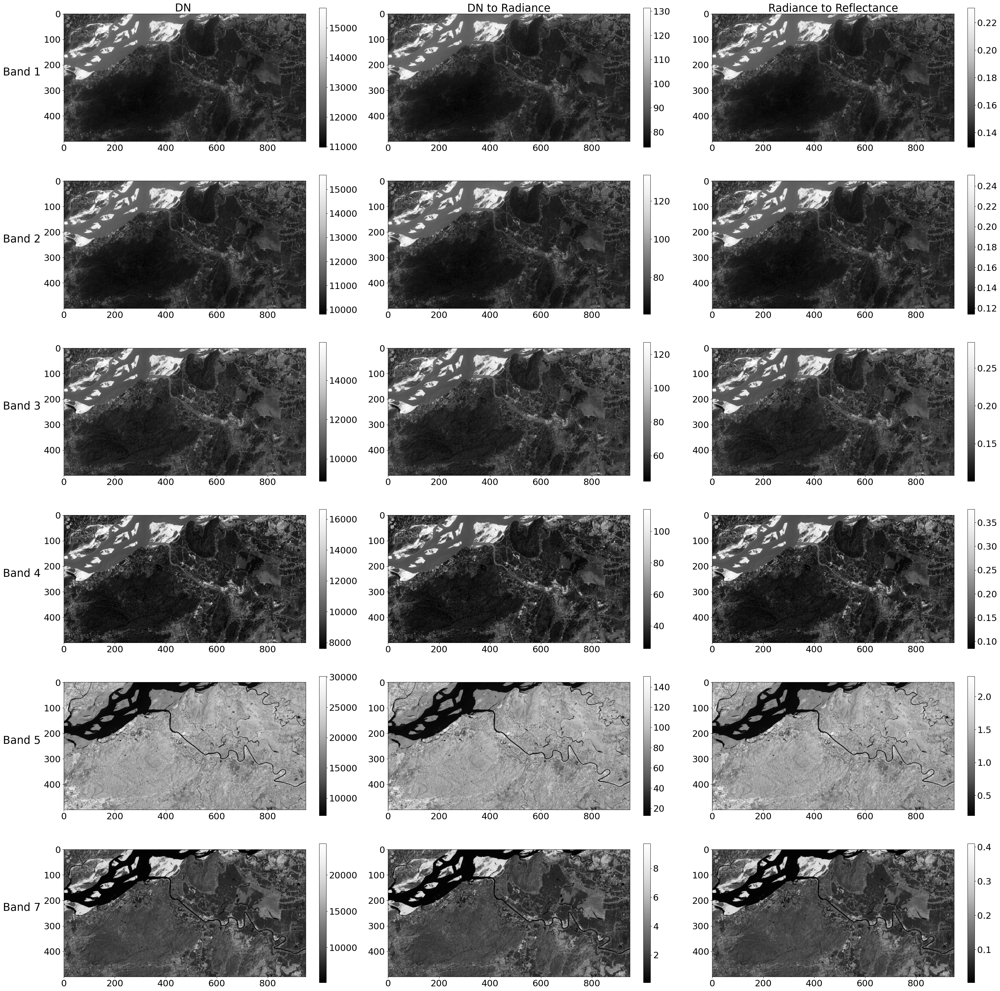

<Figure size 432x288 with 0 Axes>

In [ ]:

imagelist = list()

# Applying the mask to the images
masked_image_list = apply_mask(L7_images,'L7_masked')

"""
  This loop take all the masked images and then use the above defined fuctions
  to calculate the reflectance and then plot it. In the nutsell
  is combine all the code given above.
"""
for i,img in enumerate(masked_image_list):
  gdal_data = gdal.Open(img)
  gdal_band = gdal_data.GetRasterBand(1)
 
  data_array = gdal_data.ReadAsArray().astype(np.float)

  # replace missing values if necessary
  if np.any(data_array == 0):
    data_array[data_array == 0] = np.nan
  if i <=4:
    radiance = dn_to_radiance(data_array,i+1)
    reflectance = radiance_to_reflectance(radiance,ESUN_L7[i])
  else:
    radiance = dn_to_radiance(data_array,i+2)
    reflectance = radiance_to_reflectance(radiance,ESUN_L7[i])
  imagelist.append([data_array,radiance, reflectance])
  np.save('nmpyarr', imagelist) 
  print(f'completed{i+1}')
plot_figure(np.load('/content/nmpyarr.npy'), ['Band 1            ', 'Band 2            ','Band 3            ',
                                                'Band 4            ','Band 5            ','Band 7            '],'L7_B123457_gain_masked.png','L7_processed')


Spectral radiance scaling

In [ ]:
"""
  Arg: 
        data_arr = (array of images path of which radinace to be calculated)
        band = band of the images
    Returns:
        paths = array of radinace value of the image
    
    Function working:
        First it read the 'Lmax' , 'Lmin', 'DN max' 'DNmin' value form the L7 dictionary
        The apply the spectral radiance formula to each pixel
"""
def dn_to_radiance_spectral(data_array, band)  :

  # Getting th Lmax
  Lmax = float(Landsat7_mlt_dict['RADIANCE_MAXIMUM_BAND_'+str(band)+' '])
  
  # Getting th Lmin
  Lmin = float(Landsat7_mlt_dict['RADIANCE_MINIMUM_BAND_'+str(band)+' '])
  
  # Getting th DNmax
  DNmax = float(Landsat7_mlt_dict['QUANTIZE_CAL_MAX_BAND_'+str(band)+' '])

  #Getting the  DNmin
  DNmin = float(Landsat7_mlt_dict['QUANTIZE_CAL_MIN_BAND_'+str(band)+' '])

  new_data_array = np.empty_like(data_array)
  for i,row in enumerate(data_array):
    for j, col in enumerate(row):
      if data_array[i][j] != np.nan:
        new_data_array[i][j] = ((Lmax - Lmin)*(data_array[i][j] - DNmin)/(DNmax-DNmin)) + Lmin
  print(f'Radiance for band {band} is calculated using Specatral scaling')
  return new_data_array

In [ ]:
# creating the list of all image to be used
L7_images = [band1,
             band2,
             band3,
             band4,
             band5,band7
         ]

# creating the array of ESUN value in the increasing band order
ESUN_L7 = [1970, 1842, 1547, 1044,225.7,82.06]
imagelist = list()
masked_image_list = apply_mask(L7_images,'L7_masked')

for i,img in enumerate(masked_image_list):
  gdal_data = gdal.Open(img)
  gdal_band = gdal_data.GetRasterBand(1)
 
  data_array = gdal_data.ReadAsArray().astype(np.float)

  # replace missing values if necessary
  if np.any(data_array == 0):
    data_array[data_array == 0] = np.nan
  if i <=4:
    radiance = dn_to_radiance_spectral(data_array,i+1)
    reflectance = radiance_to_reflectance(radiance,ESUN_L7[i])
  else:
    radiance = dn_to_radiance_spectral(data_array,i+2)
    reflectance = radiance_to_reflectance(radiance,ESUN_L7[i])
  imagelist.append([data_array,radiance, reflectance])
  np.save('nmpyarr_3', imagelist) 
  print(f'Completed calculation for band {i+1} ')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


Radiance for band 1 is calculated using Specatral scaling
Reflectance of Band calculated
Completed calculation for band 1 
Radiance for band 2 is calculated using Specatral scaling
Reflectance of Band calculated
Completed calculation for band 2 
Radiance for band 3 is calculated using Specatral scaling
Reflectance of Band calculated
Completed calculation for band 3 
Radiance for band 4 is calculated using Specatral scaling
Reflectance of Band calculated
Completed calculation for band 4 
Radiance for band 5 is calculated using Specatral scaling
Reflectance of Band calculated
Completed calculation for band 5 
Radiance for band 7 is calculated using Specatral scaling
Reflectance of Band calculated
Completed calculation for band 6 


Ploting 1 band
Ploting 2 band
Ploting 3 band
Ploting 4 band
Ploting 5 band
Ploting 6 band


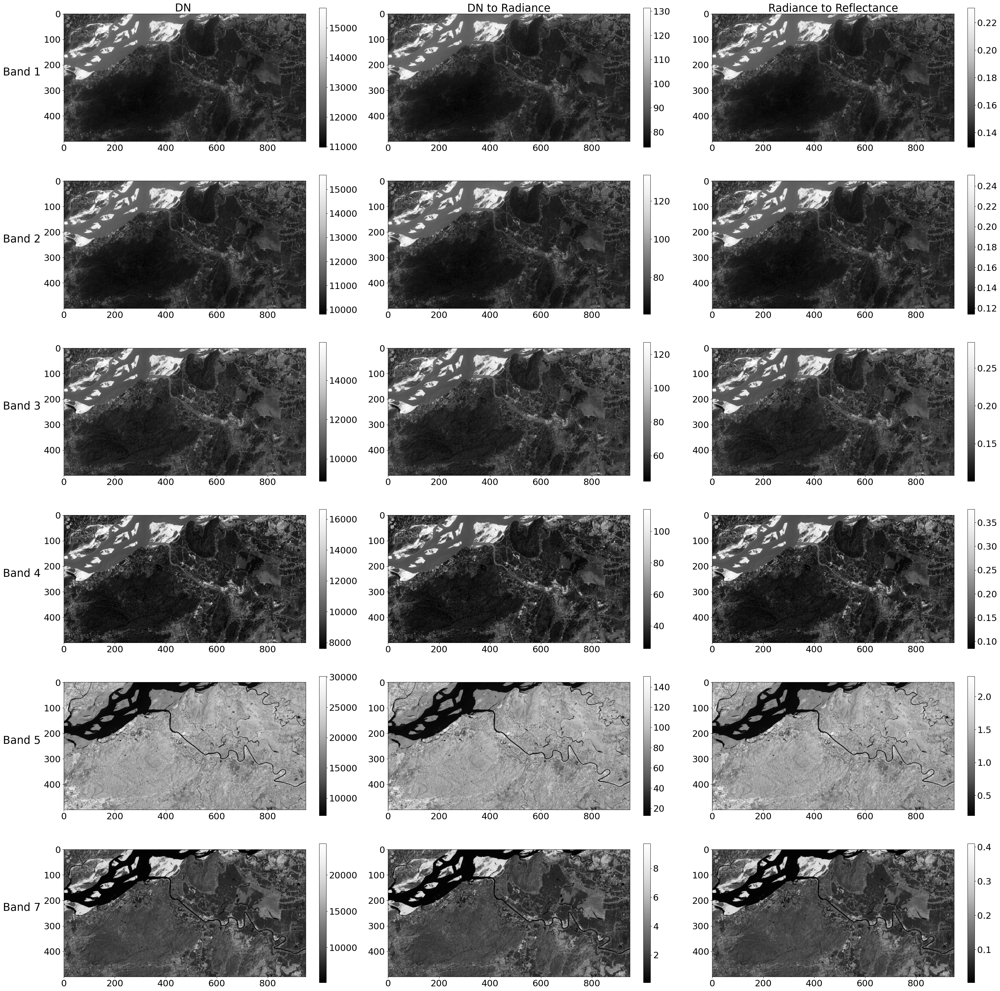

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_figure(np.load('/content/nmpyarr_3.npy'), ['Band 1            ', 'Band 2            ','Band 3            ',
                                                'Band 4            ','Band 5            ','Band 7            '],'L7_B123457_Spectral_masked.png','L7_Processed_specteral')

In [ ]:
def combine_tifs(tif_list):
    """A function that combines a list of tifs in the same CRS
    and of the same extent into an xarray object

    Parameters
    ----------
    tif_list : list
        A list of paths to the tif files that you wish to combine.
        
    Returns
    -------
    An xarray object with all of the tif files in the listmerged into 
    a single object.

    """

    out_xr=[]
    for i, tif_path in enumerate(tif_list):
        out_xr.append(rxr.open_rasterio(tif_path, masked=True).squeeze())
        out_xr[i]["band"]=i+1
     
    return xr.concat(out_xr, dim="band")

In [ ]:
# combining thr unprocessed Landsat 7 images
landsat7_unprocessed_combimed = combine_tifs(masked_image_list)

# combining the final images of landsat 8
processed_L7_images = np.load('/content/nmpyarr.npy')
landsat7_processed_combimed= combine_tifs(['/content/L7_processed/processed_0.tif',
                                     '/content/L7_processed/processed_1.tif',
                                     '/content/L7_processed/processed_2.tif',
                                     '/content/L7_processed/processed_3.tif',
                                     '/content/L7_processed/processed_4.tif',
                                     '/content/L7_processed/processed_5.tif'])
print(type(landsat7_processed_combimed))

/usr/local/lib/python3.7/dist-packages/rioxarray/_io.py:841: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))
/usr/local/lib/python3.7/dist-packages/rioxarray/_io.py:841: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))
/usr/local/lib/python3.7/dist-packages/rioxarray/_io.py:841: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))
/usr/local/lib/python3.7/dist-packages/rioxarray/_io.py:841: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))
/usr/local/lib/python3.7/dist-packages/rioxarray/_io.py:841: NotGeorefer

<class 'xarray.core.dataarray.DataArray'>


/usr/local/lib/python3.7/dist-packages/rioxarray/_io.py:841: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))


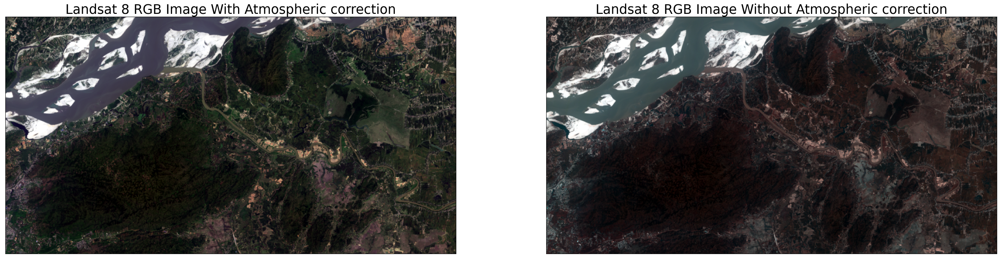

In [ ]:
# plotting RGB image of Processsed image and Unprocessed image 
# side by side

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(36, 18),dpi= 100)

# Plot of RGB composite image with polygon boundary
#bound_utm13N.boundary.plot(ax=ax1, color="black", zorder=10)
ax1 = ep.plot_rgb(
    landsat7_processed_combimed.values,
    rgb=(3,2,1),
    ax=ax1,
    stretch=True,
    
    str_clip=0.5,
    title="Landsat 8 RGB Image With Atmospheric correction",
)

# Plot of CIR composite image with polygon boundary
#bound_utm13N.boundary.plot(ax=ax2, color="black", zorder=10)
ax2 = ep.plot_rgb(
    landsat7_unprocessed_combimed.values,
    rgb=(2,1,0),
    ax=ax2,
    stretch=True,
    
    str_clip=0.5,
    title="Landsat 8 RGB Image Without Atmospheric correction",
)
plt.show()

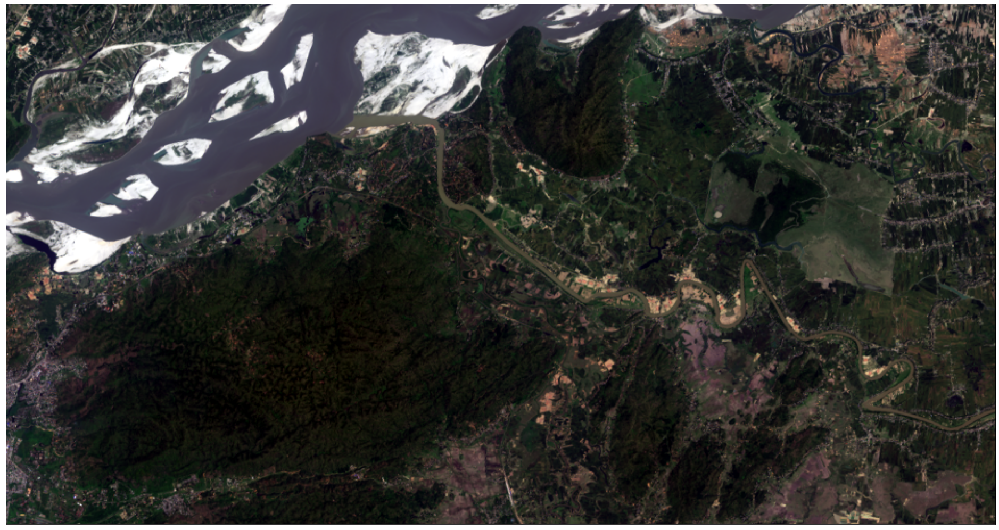

In [ ]:
fig, (ax1) = plt.subplots(1,figsize=(36, 18))
ax1 = ep.plot_rgb(
    landsat7_processed_combimed.values,
    rgb=(3,2,1),
    ax=ax1,
    stretch=True,
    str_clip=0.5,
)

plt.savefig('after_correction.png', bbox_inches='tight', pad_inches=0)

plt.show()

# Comparision

In [ ]:
import cv2
import numpy as np
import skimage.exposure

# load image
img = cv2.imread('after_correction.png')

# convert to gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold
thresh = cv2.threshold(gray, 11, 255, cv2.THRESH_BINARY)[1]

# apply morphology to clean small spots
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
morph = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, borderType=cv2.BORDER_CONSTANT, borderValue=0)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel, borderType=cv2.BORDER_CONSTANT, borderValue=0)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
morph = cv2.morphologyEx(morph, cv2.MORPH_ERODE, kernel, borderType=cv2.BORDER_CONSTANT, borderValue=0)

# get external contour
contours = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]
big_contour = max(contours, key=cv2.contourArea)

# draw white filled contour on black background as mas
contour = np.zeros_like(gray)
cv2.drawContours(contour, [big_contour], 0, 255, -1)

# blur dilate image
blur = cv2.GaussianBlur(contour, (5,5), sigmaX=0, sigmaY=0, borderType = cv2.BORDER_DEFAULT)

# stretch so that 255 -> 255 and 127.5 -> 0
mask = skimage.exposure.rescale_intensity(blur, in_range=(127.5,255), out_range=(0,255))

# put mask into alpha channel of input
result = cv2.cvtColor(img, cv2.COLOR_BGR2BGRA)
result[:,:,3] = mask
cv2.imwrite('/content/after_correction_transparent.png', result)


True

In [ ]:
file_path='/content/after_correction_transparent.png'
src = cv2.imread(file_path)

I = src.astype('float64') / 255

dark = DarkChannel(I, 15)
A = AtmLight(I, dark)
te = TransmissionEstimate(I, A, 15, 0.95)
t = TransmissionRefine(src, te)
J = Recover(I, t, A, 0.1)

# cv2.imshow("dark", dark)
# cv2.imshow("t", t)
# cv2.imshow('I', src)
# cv2.imshow('J', J)
cv2.imwrite("ans.png", t * 255)

True

In [ ]:
print(t[10][120])

0.9606596558787492


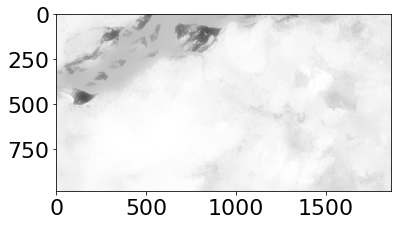

In [ ]:
darkImg = cv2.imread('ans.png')
darkImg = cv2.cvtColor(darkImg, cv2.COLOR_BGR2RGB)
plt.imshow(darkImg)
plt.show()

In [ ]:
hsvPic = cv2.cvtColor(darkImg, cv2.COLOR_RGB2HSV)
black = (0,0,0)
mask = cv2.inRange(hsvPic, black, black)
res = cv2.bitwise_and(darkImg, darkImg, mask)

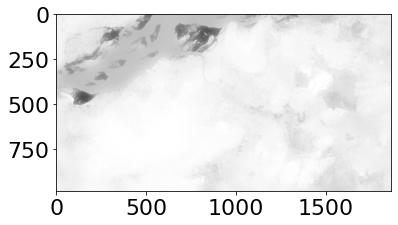

0 0 0 0


In [ ]:
x, y, w, h = cv2.boundingRect(mask)
cv2.rectangle(res, (x, y), (x + w, y + h), (0, 255, 0), 1)
plt.imshow(res)
plt.show()
print(x,y,w,h)

In [ ]:
dist = getDist(h)
center = round(((w-x)/2+x))
size=len(t[h-1])-1
print(size)
ans = math.fabs(math.log(t[h-1][size]))
print(file_path,ans)

1861
/content/after_correction_transparent.png 0.09581920428630428
